## Notebook de entrenamoento de modelo suelo

En este notebook, vamos a entrenar un modelo de YOLO con un conjunto de datos expecifico.

Nuestro objetivo es intentar entrenar un modelo para detectar suelo.
Sera entrenado con un conjunto pequeño de imagenes de interiores con sus correspondientes poligonos.

### Opción para google colabs.

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [9]:
#!pip install ultralytics

In [10]:
import matplotlib.pyplot as plt
import cv2
import torch
from ultralytics import YOLO
from google.colab import files

## Check de GPU

In [11]:
# 
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
else:
    print("CPU")

GPU: Tesla T4


In [12]:
model = YOLO('yolov8s-seg.pt')

In [17]:
import os

for item in os.listdir('/content/drive/MyDrive'):
    print(item)

Descargas
Archivos
Series
Pelis
Bootcamp Data Science
Guardado desde Chrome
Arquitectura Dashboard Personal Notion IA.gdoc
Colab Notebooks
Google AI Studio
conversacion eda gemini final 6 mayo.gdoc
Diagrama productos y proveedores
EJERCICIO DISEÑO BASES DE DATOS.drawio.pdf
NBA Draft 2026 Prediction.gslides
La herramienta de predicción para el periodista del siglo XXI.gslides
PXL_20260607_140000603.MP.jpg
2-Entrenamientos_YOLO


In [19]:
model.train(
    # Archivo yaml para definir el dataset.
    data="/content/drive/MyDrive/2-Entrenamientos_YOLO/img/data.yaml",
    epochs=50,  # Numero de epocas que defino.
    batch=16,   #Tamaño de batch.
    imgsz=640,  # Tamaño de las imagenes.
    project="modelos",  # Carpeta donde se guardará el entrenamiento.
    name="detector_floor",  # Nombre del modelo.
    save=True,      # Guardar el modelo después de entrenar.
    exist_ok=True   # Sobrescribir resultados si ya existe una carpeta.
)

Ultralytics 8.4.70 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/2-Entrenamientos_YOLO/img/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=detector_floor, nbs=64, nms=False, opset=None, optimize=False, optimiz

ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x793d9954f920>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041, 

In [20]:
results = model.val()  # Evalúa el modelo en el conjunto de validación
print(results)

Ultralytics 8.4.70 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLOv8s-seg summary (fused): 86 layers, 11,779,987 parameters, 0 gradients, 39.9 GFLOPs
val: Fast image access ✅ (ping: 0.4±0.1 ms, read: 45.8±24.1 MB/s, size: 51.1 KB)
val: Scanning /content/drive/MyDrive/2-Entrenamientos_YOLO/img/labels/val.cache... 6 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 6/6 2.5Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 2.7it/s 0.4s
                   all          6          6      0.963      0.833      0.972      0.794          1      0.783      0.922      0.858
Speed: 0.8ms preprocess, 22.3ms inference, 0.0ms loss, 7.2ms postprocess per image
Results saved to /content/runs/segment/val
ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralyt

In [21]:
import shutil

shutil.copy(
    '/content/runs/segment/modelos/detector_floor/weights/best.pt',
    '/content/drive/MyDrive/2-Entrenamientos_YOLO/best.pt'
)
print("Modelo guardado en Drive ✓")

Modelo guardado en Drive ✓


In [23]:
import os

for f in os.listdir('/content/drive/MyDrive/2-Entrenamientos_YOLO/img/images/test'):
    print(f)

8243b900-img_plano_37.jpeg
c41c6607-img_plano_38.jpg
fbeaf349-img_plano_25.jpg
b995904b-img_plano_26.jpg
e8bedb2c-img_plano_33.jpg
ae4a8804-img_plano_9.jpg
fbfb5e66-img_plano_23.jpg
2165ea93-img_plano_19.jpg


## Prueba modelo con imagenes.


image 1/1 /content/drive/MyDrive/2-Entrenamientos_YOLO/img/images/test/8243b900-img_plano_37.jpeg: 640x480 10 floors, 73.0ms
Speed: 2.8ms preprocess, 73.0ms inference, 10.5ms postprocess per image at shape (1, 3, 640, 480)


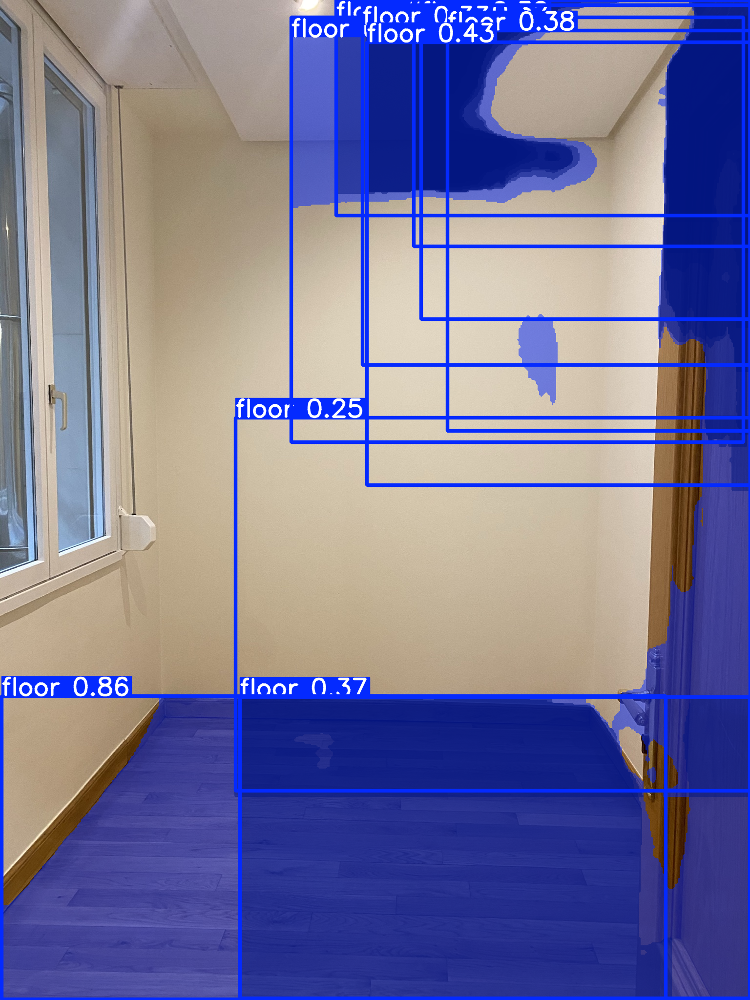

'results_8243b900-img_plano_37.jpeg'

In [24]:
model = YOLO('/content/drive/MyDrive/2-Entrenamientos_YOLO/best.pt')
img_path = "/content/drive/MyDrive/2-Entrenamientos_YOLO/img/images/test/8243b900-img_plano_37.jpeg"

results = model(img_path)

results[0].show()
results[0].save()

## Prueba con modelo entrenado el entorno virtual.


image 1/1 /content/drive/MyDrive/2-Entrenamientos_YOLO/img/images/test/8243b900-img_plano_37.jpeg: 640x480 1 floor, 16.8ms
Speed: 3.8ms preprocess, 16.8ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 480)


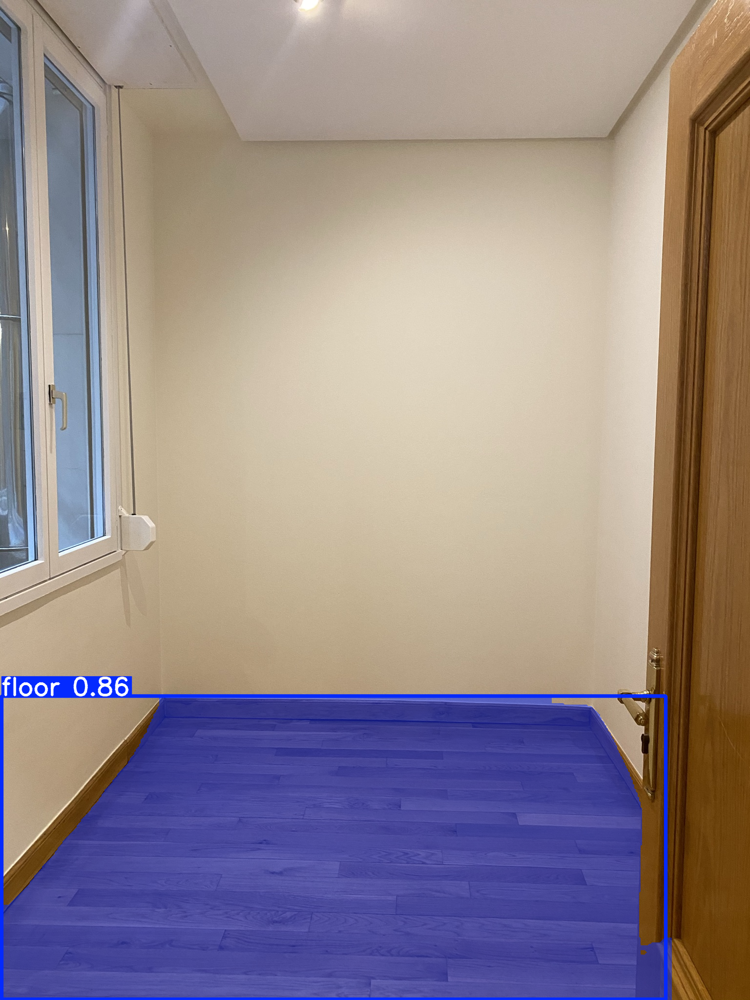

'results_8243b900-img_plano_37.jpeg'

In [25]:
model = YOLO('/content/drive/MyDrive/2-Entrenamientos_YOLO/best.pt')
img_path = "/content/drive/MyDrive/2-Entrenamientos_YOLO/img/images/test/8243b900-img_plano_37.jpeg"

results = model(img_path, conf=0.5)  # Solo detecciones con confianza > 50%

results[0].show()
results[0].save()


image 1/1 /content/drive/MyDrive/2-Entrenamientos_YOLO/img/images/test/b995904b-img_plano_26.jpg: 480x640 1 floor, 86.2ms
Speed: 5.8ms preprocess, 86.2ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)


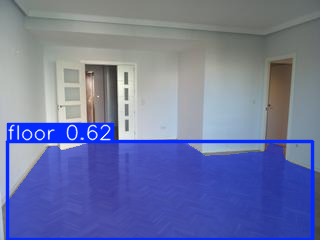

'results_b995904b-img_plano_26.jpg'

In [26]:
model = YOLO('/content/drive/MyDrive/2-Entrenamientos_YOLO/best.pt')
img_path = "/content/drive/MyDrive/2-Entrenamientos_YOLO/img/images/test/b995904b-img_plano_26.jpg"

results = model(img_path, conf=0.5)

results[0].show()
results[0].save()


image 1/1 /content/drive/MyDrive/2-Entrenamientos_YOLO/img/images/test/fbfb5e66-img_plano_23.jpg: 480x640 1 floor, 17.2ms
Speed: 4.1ms preprocess, 17.2ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


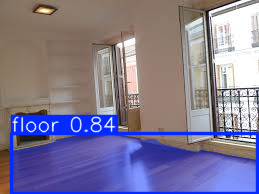


image 1/1 /content/drive/MyDrive/2-Entrenamientos_YOLO/img/images/test/2165ea93-img_plano_19.jpg: 448x640 1 floor, 86.6ms
Speed: 2.6ms preprocess, 86.6ms inference, 2.9ms postprocess per image at shape (1, 3, 448, 640)


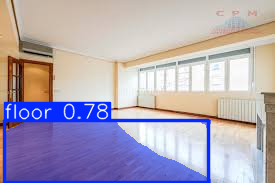

In [27]:
model = YOLO('/content/drive/MyDrive/2-Entrenamientos_YOLO/best.pt')

imagenes = [
    "/content/drive/MyDrive/2-Entrenamientos_YOLO/img/images/test/fbfb5e66-img_plano_23.jpg",
    "/content/drive/MyDrive/2-Entrenamientos_YOLO/img/images/test/2165ea93-img_plano_19.jpg"
]

for img_path in imagenes:
    results = model(img_path, conf=0.5)
    results[0].show()
    results[0].save()